In [85]:
import tensorflow as tf
import numpy as np
import scipy
from scipy import misc
import glob
from PIL import Image
import os
import matplotlib.pyplot as plt
import librosa
from keras import layers
from keras.layers import (Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, 
                          Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D)
from keras.models import Model, load_model
from keras.preprocessing import image
from keras.utils import layer_utils
import pydot
from IPython.display import SVG, Audio
from keras.layers import Dropout
from keras.utils.vis_utils import model_to_dot
from keras.utils import plot_model
from keras.optimizers import Adam
from keras.initializers import glorot_uniform
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
from pydub import AudioSegment
import shutil
import keras.backend as K
from keras.preprocessing.image import ImageDataGenerator
import random
#####################################
import sys
sys.path.insert(0, '../HelperFiles')
from HelperFunctions import *
#####################################
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, plot_confusion_matrix

gpu_devices = tf.config.experimental.list_physical_devices('GPU')
for device in gpu_devices:
    tf.config.experimental.set_memory_growth(device, True)

In [86]:
# Set the seed value for experiment reproducibility.
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)

In [ ]:
savedModelsPath = "../saved"

In [87]:
genres = 'blues classical country disco hiphop jazz metal pop reggae rock'
genres = genres.split()

model = keras.models.load_model("{savedModelsPath}/saved_cnn2_3", compile=False)

In [88]:
import pathlib
input_dir = pathlib.Path("input/")
audio_file_name = "chimera.wav"
sample_dir = "input/samples/"
audio_seg_dir = "input/audio_segments/"
spec_dir = "input/specs_segments/"

if not input_dir.exists():
    os.mkdir("input")
    os.mkdir(sample_dir)
    os.mkdir(audio_seg_dir)

sample, sample_sr = librosa.load(os.path.join(sample_dir, audio_file_name))
sample_duration = int(librosa.get_duration(y=sample, sr=sample_sr))
Audio(sample, rate=sample_sr)

In [89]:
predictions = []

for f in os.listdir(audio_seg_dir):
    os.remove(os.path.join(audio_seg_dir, f))

### For 3 Sec Segments!
chopAudio(os.path.join(sample_dir, audio_file_name), audio_seg_dir)

# Remove old spec images
if not os.path.exists(spec_dir):
    os.mkdir(spec_dir)

for f in os.listdir(spec_dir):
    os.remove(os.path.join(spec_dir, f))

audiosToGraph(audio_seg_dir, spec_dir, "ms_old")

for af in os.listdir(spec_dir):
    image_data = load_img(os.path.join(spec_dir, af[:-3] + 'png'),color_mode='rgba',target_size=(288,432))
    image = img_to_array(image_data)
    image = np.reshape(image,(1,288,432,4))
    
    p = model.predict(image/255)
    p = p.reshape((10,))

    predictions.append(p)

1/1 [==============================] - 0s 10ms/step


In [90]:
avg_preds = [x / len(predictions) for x in np.array(predictions).sum(axis=0)]
predicted_label = np.argmax(avg_preds)

print("The Predicted Label was: " + genres[predicted_label])

The Predicted Label was: hiphop


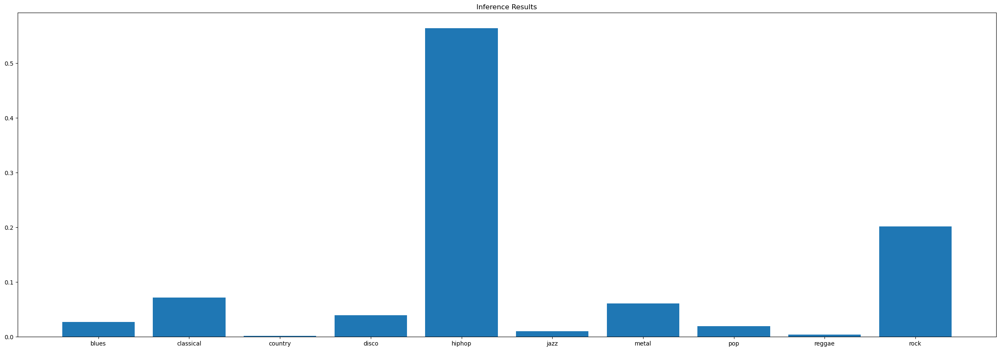

In [91]:
plt.figure(figsize=(30,10))
plt.bar(genres, np.array(avg_preds))
plt.title("Inference Results")
plt.show()